In [1]:
from gnomepy.backtest.backtest import *
from gnomepy.backtest.strategy import *
import matplotlib.pyplot as plt
from statsmodels.tsa.vector_ar.vecm import coint_johansen
import numpy as np
import multiprocessing as mp


In [10]:
# Define base listings that will be used for all strategies
base_listings = [
    Listing(exchange_id=4, security_id=1),
    Listing(exchange_id=7, security_id=1), 
    Listing(exchange_id=9, security_id=1)
]

# Define parameter variations to test
param_variations = [
    {'trade_frequency': 60},
    {'trade_frequency': 50},  
    {'trade_frequency': 40},
    {'trade_frequency': 30},
    {'trade_frequency': 20},
    {'trade_frequency': 10},
]

# Create list of strategies with different parameters
strategies = []
for params in param_variations:
    strategy = CointegrationStrategy(
        listings=base_listings,
        data_schema_type=SchemaType.MBP_10,
        trade_frequency=params.get('trade_frequency', 25),
        beta_refresh_frequency=1000,
        spread_window=params.get('spread_window', 100),
        enter_zscore=params.get('enter_zscore', 2.0),
        exit_zscore=params.get('exit_zscore', 0.3),
        stop_loss_delta=np.inf,
        retest_cointegration=False,
        use_extends=False,
        use_lob=False,
        use_dynamic_sizing=True,
        significance_level=0.05
    )
    strategies.append(strategy)

In [11]:
strategies

In [12]:
backtest = Backtest(client = MarketDataClient(bucket="gnome-market-data-prod", aws_profile_name="AWSAdministratorAccess-241533121172"), strategies=strategies, start_datetime=datetime.datetime(2025, 6, 18), end_datetime=datetime.datetime(2025, 6, 19))

In [13]:
metrics, history = backtest.run(data_type='pandas')

Starting backtest from 2025-06-18 00:00:00 to 2025-06-19 00:00:00
Total ticks to process: 85274
Initialized strategy: CointegrationStrategy
Initialized strategy: CointegrationStrategy
Initialized strategy: CointegrationStrategy
Initialized strategy: CointegrationStrategy
Initialized strategy: CointegrationStrategy
Initialized strategy: CointegrationStrategy
Processing tick 10000
Processing tick 1000
Update beta vectors
Number of coints 1
Updated beta vec:  [[ 614.12743648]
 [-522.97171529]
 [ 157.05812561]]
Processing tick 10010
Processing tick 1001
Exiting negative reversion position - z_score: -0.43
Generated exit signals with inverted beta vector: [[-0.74731545]
 [ 0.63639046]
 [-0.19111988]]
Generated 1 signals from CointegrationStrategy at tick 10010
Processing 1 total signals at tick 10010:
  Signal: <gnomepy.backtest.signal.BasketSignal object at 0x133562660>
Signal validation failed for exit_negative_mean_reversion
Signal attempted to exit_negative_mean_reversion, when the stra

In [16]:
history

,timestamp,listing,action,size,price,cash_flow,strategy,pl,cum_pl
0,2025-06-18 14:35:07.436000+00:00,1,BUY,36.910164,2.15280,-79.495959,CointegrationStrategy(listings=[Listing(exchan...,-79.495959,-79.495959
1,2025-06-18 14:36:47.145000+00:00,1,SELL,24.198342,2.79630,67.635373,CointegrationStrategy(listings=[Listing(exchan...,67.635373,-11.860586
3,2025-06-18 14:39:43.205000+00:00,1,SELL,34.625189,2.15830,74.697915,CointegrationStrategy(listings=[Listing(exchan...,74.697915,62.837329
6,2025-06-18 14:40:42.026000+00:00,1,BUY,36.033625,2.15310,-77.618910,CointegrationStrategy(listings=[Listing(exchan...,-77.618910,-14.781581
4,2025-06-18 14:41:00.172000+00:00,1,BUY,22.739600,2.79860,-63.667683,CointegrationStrategy(listings=[Listing(exchan...,-63.667683,-78.449265
...,...,...,...,...,...,...,...,...,...
251,2025-06-19 00:28:23.683000+00:00,1,BUY,97.966751,0.17124,-16.783375,CointegrationStrategy(listings=[Listing(exchan...,-16.783375,-169.456482
254,2025-06-19 00:28:31.508000+00:00,1,SELL,93.339753,0.17126,15.978173,CointegrationStrategy(listings=[Listing(exchan...,15.978173,-153.478309
257,2025-06-19 00:40:02.804000+00:00,1,BUY,101.795400,0.17118,-17.433178,CointegrationStrategy(listings=[Listing(exchan...,-17.433178,-170.911487
260,2025-06-19 00:43:43.107000+00:00,1,SELL,95.888476,0.17169,16.455684,CointegrationStrategy(listings=[Listing(exchan...,16.455684,-0.258530


/var/folders/xs/59kj_n6d2qs33ypnrkskvyzh0000gn/T/ipykernel_43546/2004106769.py:12: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


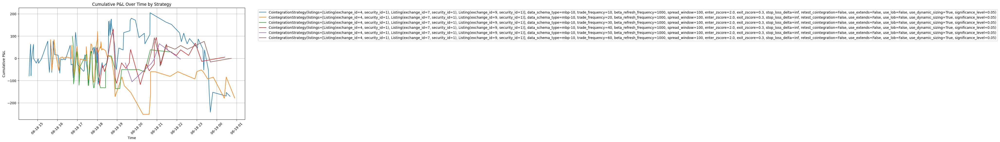

In [14]:
# Plot P&L over time grouped by strategy
plt.figure(figsize=(12,6))
for strategy_name in history['strategy'].unique():
    strategy_data = history[history['strategy'] == strategy_name]
    plt.plot(strategy_data['timestamp'], strategy_data['cum_pl'], label=strategy_name)
plt.title('Cumulative P&L Over Time by Strategy')
plt.xlabel('Time')
plt.ylabel('Cumulative P&L')
plt.grid(True)
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# # Plot trade sizes over time grouped by strategy
# plt.figure(figsize=(12,6))
# for strategy_name in history['strategy'].unique():
#     strategy_data = history[history['strategy'] == strategy_name]
#     plt.scatter(strategy_data['timestamp'], strategy_data['size'], 
#                c=strategy_data['action'].map({'BUY': 'green', 'SELL': 'red'}),
#                alpha=0.5, label=strategy_name)
# plt.title('Trade Sizes Over Time by Strategy')
# plt.xlabel('Time') 
# plt.ylabel('Trade Size')
# plt.grid(True)
# plt.xticks(rotation=45)
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
# plt.tight_layout()
# plt.show()